# Life Satisfaction in European Union 

In [56]:
# Import libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [57]:
# Load Data
data = pd.read_csv(r"C:\Users\Hasnain\Downloads\Life_Satisfaction_1.csv")
data.head()

,"freq,life_sat,statinfo,isced11,sex,age,unit,geo",2013,2018,2022
0,"A,ACCOM,AVG,ED0-2,F,Y16-19,RTG,AT",8.7,NaN,NaN
1,"A,ACCOM,AVG,ED0-2,F,Y16-19,RTG,BE",8.0,NaN,NaN
2,"A,ACCOM,AVG,ED0-2,F,Y16-19,RTG,BG",6.0,NaN,NaN
3,"A,ACCOM,AVG,ED0-2,F,Y16-19,RTG,CH",8.5,NaN,NaN
4,"A,ACCOM,AVG,ED0-2,F,Y16-19,RTG,CY",8.3,NaN,NaN


In [58]:
df = pd.DataFrame(data)

# Split the first column into multiple columns based on commas
df_split = df['freq,life_sat,statinfo,isced11,sex,age,unit,geo'].str.split(',', expand=True)

# Assign meaningful column names
df_split.columns = ['freq', 'life_sat', 'statinfo', 'isced11', 'sex', 'age', 'unit', 'geo']

# Combine the split columns with the years (2013, 2018, 2022)
df_final = pd.concat([df_split, df['2013'], df['2018'], df['2022']], axis=1)

# Display the first few rows
print(df_final.head())

  freq life_sat statinfo isced11 sex     age unit geo  2013  2018  2022
0    A    ACCOM      AVG   ED0-2   F  Y16-19  RTG  AT   8.7   NaN   NaN
1    A    ACCOM      AVG   ED0-2   F  Y16-19  RTG  BE   8.0   NaN   NaN
2    A    ACCOM      AVG   ED0-2   F  Y16-19  RTG  BG   6.0   NaN   NaN
3    A    ACCOM      AVG   ED0-2   F  Y16-19  RTG  CH   8.5   NaN   NaN
4    A    ACCOM      AVG   ED0-2   F  Y16-19  RTG  CY   8.3   NaN   NaN


### Basic Data Overview

In [59]:
# Basic information about the dataset (types, non-null counts)
print(df_final.info())

# Get the first few rows of the dataset
print(df_final.head())

# Get summary statistics for numerical columns (years in your case)
print(df_final.describe())

# Check for missing values
print(df_final.isnull().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52260 entries, 0 to 52259
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   freq      52260 non-null  object 
 1   life_sat  52260 non-null  object 
 2   statinfo  52260 non-null  object 
 3   isced11   52260 non-null  object 
 4   sex       52260 non-null  object 
 5   age       52260 non-null  object 
 6   unit      52260 non-null  object 
 7   geo       52260 non-null  object 
 8   2013      45502 non-null  float64
 9   2018      21391 non-null  float64
 10  2022      14434 non-null  float64
dtypes: float64(3), object(8)
memory usage: 4.4+ MB
None
  freq life_sat statinfo isced11 sex     age unit geo  2013  2018  2022
0    A    ACCOM      AVG   ED0-2   F  Y16-19  RTG  AT   8.7   NaN   NaN
1    A    ACCOM      AVG   ED0-2   F  Y16-19  RTG  BE   8.0   NaN   NaN
2    A    ACCOM      AVG   ED0-2   F  Y16-19  RTG  BG   6.0   NaN   NaN
3    A    ACCOM      AVG   ED0-2   F  Y

### Check for Duplicates

In [60]:
# Check for duplicate rows
print(df_final.duplicated().sum())

0


### Descriptive Statistics for Numeric Data

In [61]:
# Get summary statistics for numeric columns (years)
print(df_final[['2013', '2018', '2022']].describe())

# Calculate the mean of the year columns
print(df_final[['2013', '2018', '2022']].mean())

# Calculate the median of the year columns
print(df_final[['2013', '2018', '2022']].median())

# Calculate the standard deviation for the year columns
print(df_final[['2013', '2018', '2022']].std())

               2013          2018          2022
count  45502.000000  21391.000000  14434.000000
mean       7.189157      7.116820      7.084627
std        0.988177      1.080827      1.048498
min        1.800000      2.700000      2.400000
25%        6.600000      6.500000      6.400000
50%        7.400000      7.200000      7.200000
75%        7.900000      7.900000      7.900000
max        9.600000      9.500000      9.400000
2013    7.189157
2018    7.116820
2022    7.084627
dtype: float64
2013    7.4
2018    7.2
2022    7.2
dtype: float64
2013    0.988177
2018    1.080827
2022    1.048498
dtype: float64


### Handling Missing Values

In [62]:
# Select numeric columns only
numeric_columns = df_final.select_dtypes(include=['float64', 'int64'])

# Fill NaN values in numeric columns with the median of each column
df_final_filled = df_final.copy()
df_final_filled[numeric_columns.columns] = numeric_columns.fillna(numeric_columns.median())

# Now the sample of the filled dataset
print(df_final_filled.sample(25))

      freq  life_sat statinfo isced11 sex     age unit        geo  2013  2018  \
31607    A  MEANLIFE      AVG   ED3_4   T  Y_GE65  RTG  EU27_2020   7.5   7.2   
49679    A      TIME      AVG   ED5-8   F  Y_GE65  RTG         RS   7.5   7.5   
5193     A     ACCOM      AVG   TOTAL   T  Y16-24  RTG         EL   6.7   7.2   
30006    A  MEANLIFE      AVG   ED0-2   T  Y25-34  RTG         RS   7.1   7.2   
7608     A       COM      AVG   ED3_4   M  Y20-24  RTG         FI   7.8   7.2   
9670     A       COM      AVG   ED5-8   T  Y50-64  RTG         ME   7.3   7.2   
50998    A      TIME      AVG   TOTAL   F  Y25-64  RTG         MK   6.2   5.9   
41227    A    REC_GA      AVG   ED0-2   M  Y25-34  RTG         LT   6.6   7.2   
24533    A    LIVENV      AVG   ED0-2   T  Y65-74  RTG         RO   7.4   7.2   
31174    A  MEANLIFE      AVG   ED3_4   M  Y_GE75  RTG         ES   6.9   7.2   
31441    A  MEANLIFE      AVG   ED3_4   T  Y25-64  RTG         NL   7.7   7.2   
34221    A  MEANLIFE      AV

### Grouping and Aggregating Data
I want to analyze the data by grouping it by certain categories, like sex, geo, or statinfo.

In [63]:
# Group by 'geo' and calculate the average for each year
geo_grouped = df_final.groupby('geo')[['2013', '2018', '2022']].mean()
print(geo_grouped)

# Group by 'sex' and calculate the average for each year
sex_grouped = df_final.groupby('sex')[['2013', '2018', '2022']].mean()
print(sex_grouped)

               2013      2018      2022
geo                                    
AL              NaN  5.759184       NaN
AT         7.978638  7.846140  7.800667
BE         7.515818  7.421441  7.427669
BG         5.522459  5.733688  5.539374
CH         7.980380  7.830690  7.823556
CY         6.864742  7.228648  7.016892
CZ         7.338930  7.322285  7.266194
DE         7.252901  7.172789       NaN
DK         8.156496  7.742509  7.468468
EA20            NaN       NaN  7.135024
EE         6.963490  7.106143  7.149550
EL         6.207650  6.067839  6.146980
ES         7.128993  7.314626  7.062527
EU27_2020  7.184500  7.211896  7.156127
FI         8.024689  7.992460  7.800959
FR         7.283165  7.316608  6.971491
HR         6.608551  6.639200  6.606383
HU         6.665184  6.725352  6.710135
IE         7.548741  7.917164  7.455882
IS         7.823027  7.736581       NaN
IT         6.763713  7.090339  7.103050
LT         7.373626  6.671346  7.131429
LU         7.720610  7.323432  7.114120


### Finding the Most Common Values
You can explore categorical columns to see the most common values.

In [64]:
# Most common values in 'freq' column
print(df_final['freq'].value_counts())

# Most common values in 'life_sat' column
print(df_final['life_sat'].value_counts())

# Most common values in 'geo' column
print(df_final['geo'].value_counts())

freq
A    52260
Name: count, dtype: int64
life_sat
FIN         6084
TIME        6084
PER_RELS    6084
JOB         5928
ACCOM       5616
LIVENV      5616
COM         5616
MEANLIFE    5616
REC_GA      5616
Name: count, dtype: int64
geo
AT           1404
BE           1404
BG           1404
CH           1404
CY           1404
CZ           1404
DE           1404
DK           1404
EE           1404
EL           1404
ES           1404
EU27_2020    1404
FI           1404
FR           1404
HR           1404
HU           1404
IE           1404
IS           1404
IT           1404
LT           1404
LU           1404
LV           1404
ME           1404
MK           1404
MT           1404
NL           1404
NO           1404
PL           1404
PT           1404
RO           1404
RS           1404
SE           1404
SI           1404
SK           1404
TR           1404
UK           1404
AL            624
XK            624
EA20          468
Name: count, dtype: int64


### Correlations
I want to check for correlations between the numeric columns (years 2013, 2018, and 2022).

          2013      2018      2022
2013  1.000000  0.911135  0.882254
2018  0.911135  1.000000  0.917684
2022  0.882254  0.917684  1.000000


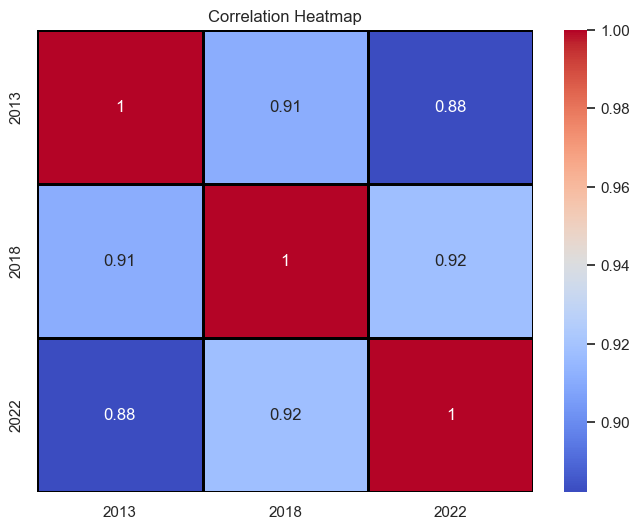

In [65]:
# Correlation between the year columns
correlation_matrix = df_final[['2013', '2018', '2022']].corr()
print(correlation_matrix)
# Create a heatmap with color scale
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=1, linecolor='black')
plt.title("Correlation Heatmap")
plt.show()

### Handling Categorical Data
For categorical columns like sex, age, or unit, you can check the distribution of each category.

In [66]:
# Count unique values in 'sex' column
print(df_final['sex'].value_counts())

# Count unique values in 'age' column
print(df_final['age'].value_counts())

sex
F    17420
M    17420
T    17420
Name: count, dtype: int64
age
Y16-19    4020
Y16-24    4020
Y16-29    4020
Y20-24    4020
Y25-29    4020
Y25-34    4020
Y25-64    4020
Y35-49    4020
Y50-64    4020
Y65-74    4020
Y_GE16    4020
Y_GE65    4020
Y_GE75    4020
Name: count, dtype: int64


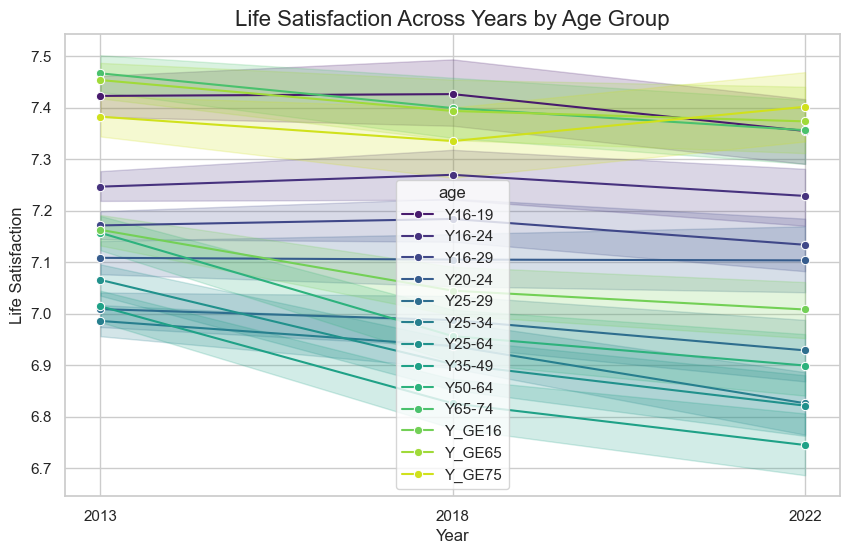

In [74]:
# Set up the Seaborn style
sns.set(style="whitegrid")

# Create a Seaborn line plot
plt.figure(figsize=(10, 6))
sns.lineplot(x="variable", y="value", hue="age", data=df_final.melt(id_vars=["age"], value_vars=["2013", "2018", "2022"]),
             marker="o", palette="viridis")

# Add title and labels
plt.title("Life Satisfaction Across Years by Age Group", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Life Satisfaction", fontsize=12)
plt.xticks([0, 1, 2], ["2013", "2018", "2022"])

# Show plot
plt.show()

Year (2013, 2018, 2022): This graph visualizes how life satisfaction (life_sat) varies over time (across different years) for various age groups and genders.
Life Satisfaction across Age Groups: This graph helps understand how life satisfaction varies with different age groups over the years, comparing various age categories.

In [73]:
# Melt the data for easy plotting with Plotly
df_melted = df_final.melt(id_vars=["age"], value_vars=["2013", "2018", "2022"], var_name="Year", value_name="Life Satisfaction")

# Create Plotly line plot
fig = px.line(df_melted, x="Year", y="Life Satisfaction", color="age", markers=True,
              title="Life Satisfaction Over Time by Age Group", labels={"Life Satisfaction": "Life Satisfaction"})
fig.update_xaxes(type="category")  # Ensure years are treated as categories
fig.show()

Display interactive life satisfaction values across the years, segmented by age groups.

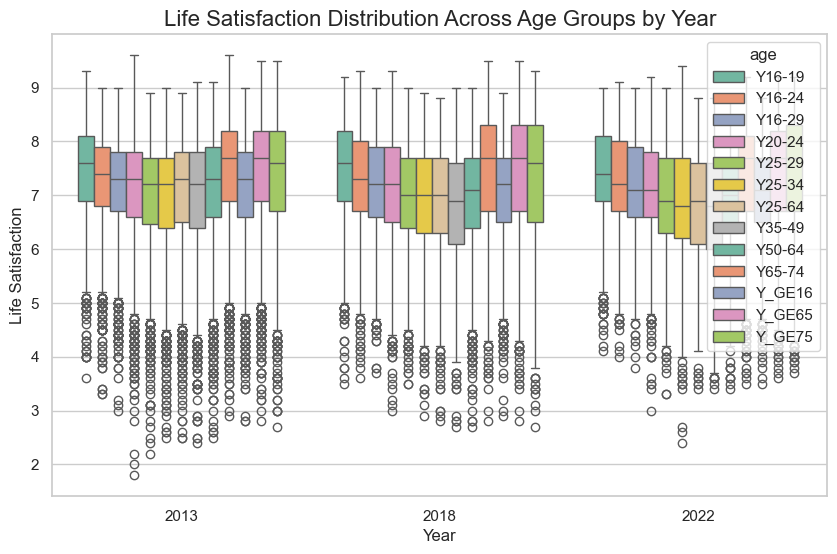

In [69]:
# Seaborn boxplot to show life satisfaction distribution across age for each year
plt.figure(figsize=(10, 6))
sns.boxplot(x="variable", y="value", hue="age", data=df_final.melt(id_vars=["age"], value_vars=["2013", "2018", "2022"]),
            palette="Set2")

# Add title and labels
plt.title("Life Satisfaction Distribution Across Age Groups by Year", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Life Satisfaction", fontsize=12)
plt.xticks([0, 1, 2], ["2013", "2018", "2022"])

# Show plot
plt.show()

Visualize how life satisfaction differs across age groups for each of the years (2013, 2018, 2022).

In [70]:
# Melt the data to long format for Plotly
df_melted_plotly = df_final.melt(id_vars=["life_sat"], value_vars=["2013", "2018", "2022"], var_name="Year", value_name="Life Satisfaction")

# Create a violin plot for life satisfaction distribution
fig = px.violin(df_melted_plotly, y="Life Satisfaction", x="Year", color="life_sat", box=True, 
                title="Life Satisfaction Distribution Across Years (Plotly)", 
                labels={'Life Satisfaction': 'Life Satisfaction Score', 'Year': 'Year'})
fig.update_layout(title="Life Satisfaction Distribution Across Years (Plotly)")
fig.show()

### Conclusion
The life satisfaction levels in the European Union, based on the sample data, generally show a moderate to slight decline from 2013 to 2022. Many individuals report life satisfaction around 7.0 to 8.0 across different countries, but 2022 appears to have a lower average satisfaction compared to earlier years. Notable declines are seen in countries like Latvia, Slovakia, and Hungary, where satisfaction dropped significantly in 2022. This trend could reflect ongoing challenges such as COVID-19 pandemic, economic uncertainty, post-pandemic recovery, and shifting societal conditions. Despite this, some countries like Iceland and Finland still report relatively high satisfaction levels, indicating regional variation.